# Загрузка библиотек и исходных данных

In [146]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()
sns.set_style('darkgrid')
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score as f1
from sklearn.metrics import confusion_matrix, plot_roc_curve, roc_curve
import seaborn as sns

plt.rc('figure',figsize=(18,9))
# %pip install imbalanced-learn
from imblearn.over_sampling import SMOTE

In [147]:
def configure_plotly_browser_state():   # correct plotly working in colab
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [148]:
# from google.colab import files
# uploaded = files.upload()
# import io
# df = pd.read_csv(io.BytesIO(uploaded['BankChurners.csv']))

df = pd.read_csv('BankChurners.csv', low_memory=False) # for local file

Saving BankChurners.csv to BankChurners (2).csv


In [149]:
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.999910
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.999940
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.999980
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.999870
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.999980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0.000191,0.999810
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0.995270,0.004729
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0.997880,0.002118
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0.996710,0.003294


Отсечение двух последних столбцов за ненадобностью

In [150]:
df = df[df.columns[:-2]]
df.head(3)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000


#Анализ данных

##Возраст клиентов

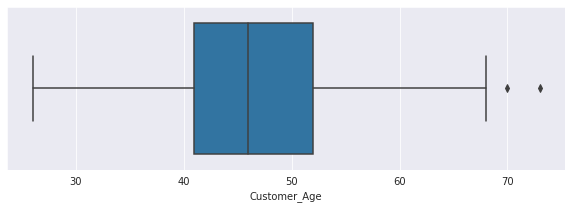

In [151]:
plt.figure(figsize=(10,3))
sns.boxplot(data=df, x='Customer_Age')
plt.show()

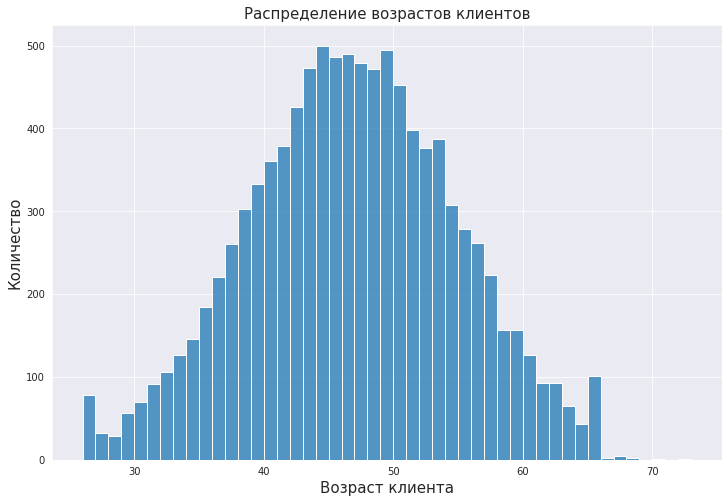

In [152]:
plt.figure(figsize=(12,8))
sns.histplot(data=df, x='Customer_Age')
plt.title('Распределение возрастов клиентов', fontsize=15)
plt.ylabel('Количество', fontsize=15)
plt.xlabel('Возраст клиента', fontsize=15)
plt.show()

In [153]:
configure_plotly_browser_state()
fig = make_subplots(
    rows=2, cols=2,subplot_titles=('','<b>Держатели платиновых карт','<b>Держатели синих карт<b>','Residuals'),
    vertical_spacing=0.09,
    specs=[[{"type": "pie","rowspan": 2}       ,{"type": "pie"}] ,
           [None                               ,{"type": "pie"}]            ,                                      
          ]
)

fig.add_trace(
    go.Pie(values=df.Gender.value_counts().values,labels=['<b>Женщины<b>','<b>Мужчины<b>'],hole=0.3,pull=[0,0.3]),
    row=1, col=1
)

fig.add_trace(
    go.Pie(
        labels=['Платиновая карта, женщины','Платиновая карта, мужчины'],
        values=df.query('Card_Category == "Platinum"').Gender.value_counts().values,
        pull=[0,0.05,0.5],
        hole=0.3
        
    ),
    row=1, col=2
)

fig.add_trace(
    go.Pie(
        labels=['Синяя карта, женщины','Синяя карта, мужчины'],
        values=df.query('Card_Category=="Blue"').Gender.value_counts().values,
        pull=[0,0.2,0.5],
        hole=0.3
    ),
    row=2, col=2
)



fig.update_layout(
    height=700,
    showlegend=True,
    title_text="<b>Распределение пола по держателям карт<b>",
)

fig.show()

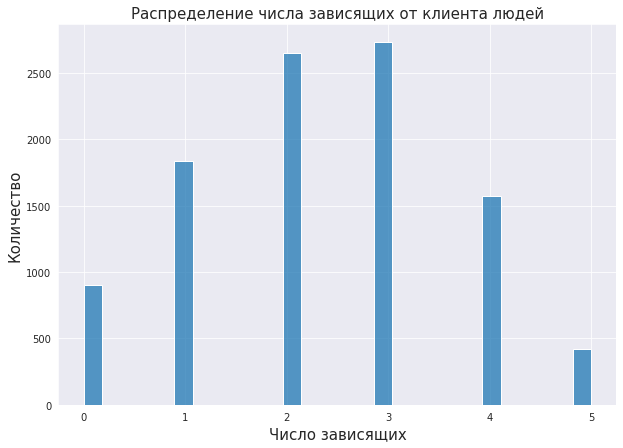

In [154]:
plt.figure(figsize=(10,7))
sns.histplot(data=df, x='Dependent_count')
plt.title('Распределение числа зависящих от клиента людей', fontsize=15)
plt.ylabel('Количество', fontsize=15)
plt.xlabel('Число зависящих', fontsize=15)
plt.show()

In [155]:
configure_plotly_browser_state()
ex.pie(df,names='Education_Level',title='Propotion Of Education Levels',hole=0.33)

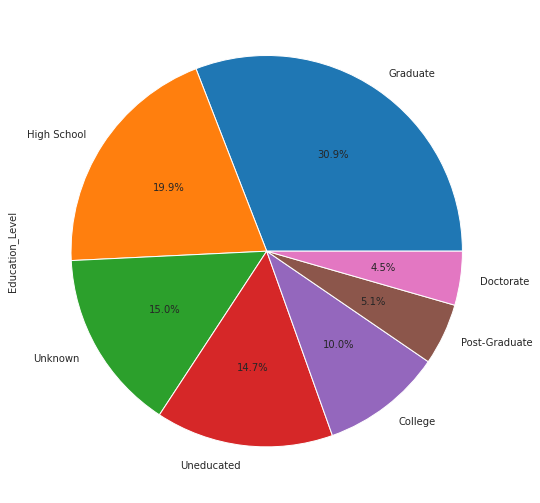

In [156]:
df.Education_Level.value_counts().plot.pie(autopct='%1.1f%%')

In [157]:
configure_plotly_browser_state()
ex.pie(df,names='Marital_Status',title='Propotion Of Different Marriage Statuses',hole=0.33)

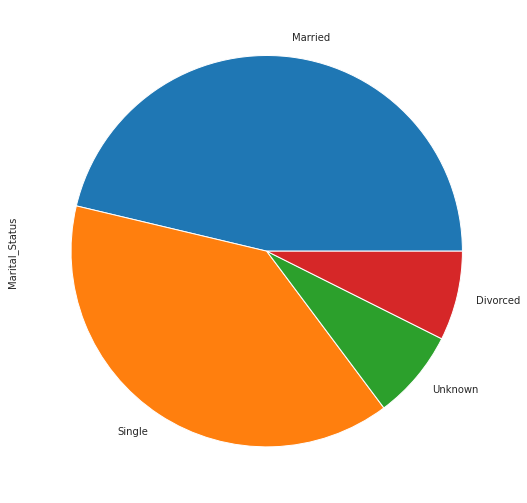

In [158]:
df.Marital_Status.value_counts().plot.pie()

In [159]:
configure_plotly_browser_state()
ex.pie(df,names='Income_Category',title='Propotion Of Different Income Levels',hole=0.33)

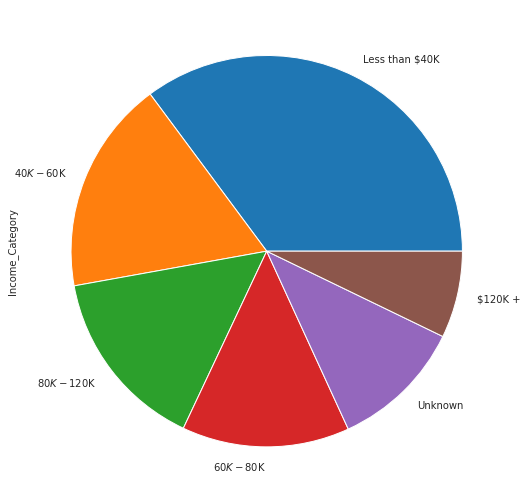

In [160]:
df.Income_Category.value_counts().plot.pie()

In [161]:
configure_plotly_browser_state()
ex.pie(df,names='Card_Category',title='Propotion Of Different Card Categories',hole=0.33)

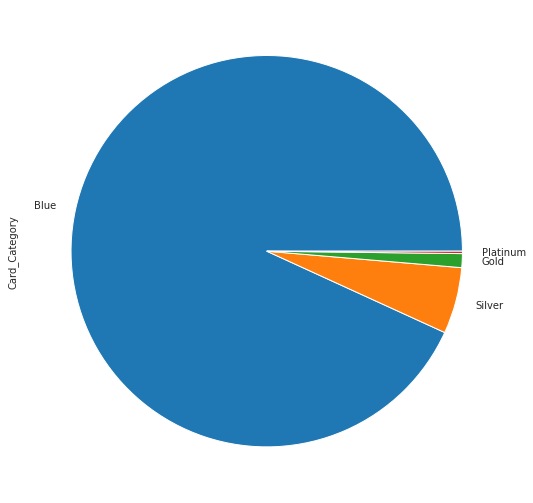

In [162]:
df.Card_Category.value_counts().plot.pie()

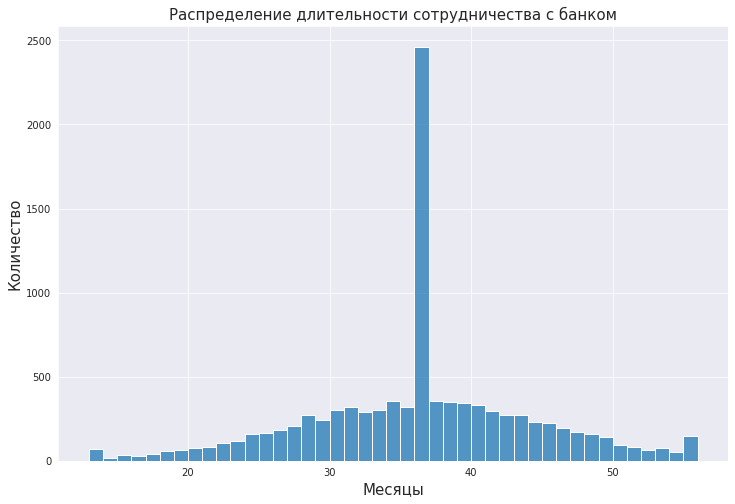

In [163]:
plt.figure(figsize=(12,8))
sns.histplot(data=df,x='Months_on_book',binwidth=1)
plt.title('Распределение длительности сотрудничества с банком', fontsize=15)
plt.ylabel('Количество', fontsize=15)
plt.xlabel('Месяцы', fontsize=15)
plt.show()

In [164]:
print('Момент эксцесса: {}'.format(df['Months_on_book'].kurt()))

Момент эксцесса: 0.40010012019986707


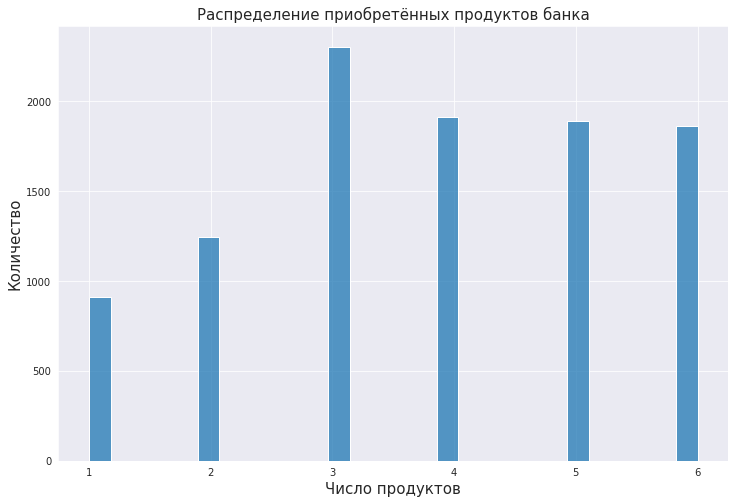

In [165]:
plt.figure(figsize=(12,8))
sns.histplot(data=df,x='Total_Relationship_Count')
plt.title('Распределение приобретённых продуктов банка', fontsize=15)
plt.ylabel('Количество', fontsize=15)
plt.xlabel('Число продуктов', fontsize=15)
plt.show()

Text(0.5, 0, 'Месяцы')

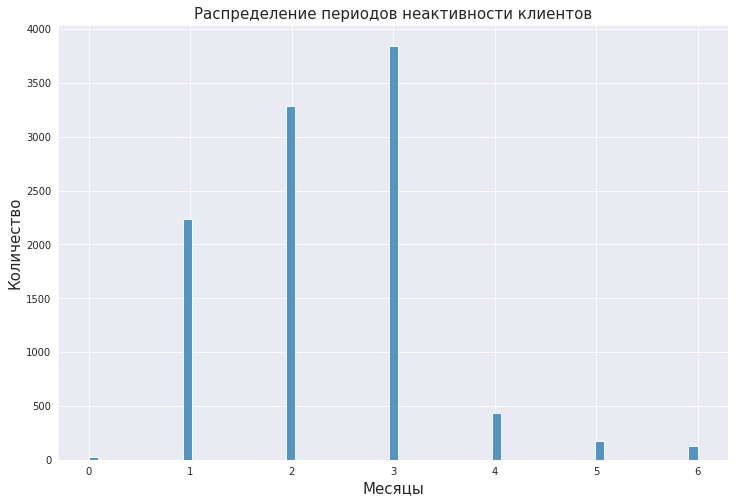

In [166]:
plt.figure(figsize=(12,8))
sns.histplot(data=df,x='Months_Inactive_12_mon')
plt.title('Распределение периодов неактивности клиентов', fontsize=15)
plt.ylabel('Количество', fontsize=15)
plt.xlabel('Месяцы', fontsize=15)

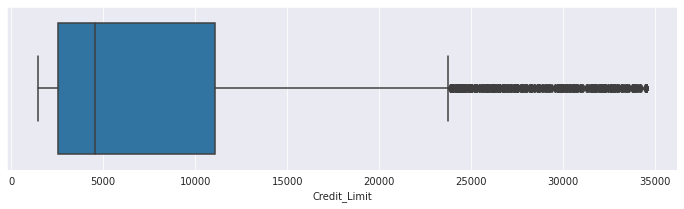

In [167]:
plt.figure(figsize=(12, 3))
sns.boxplot(data=df,x='Credit_Limit')

Text(0.5, 0, 'Лимит ($)')

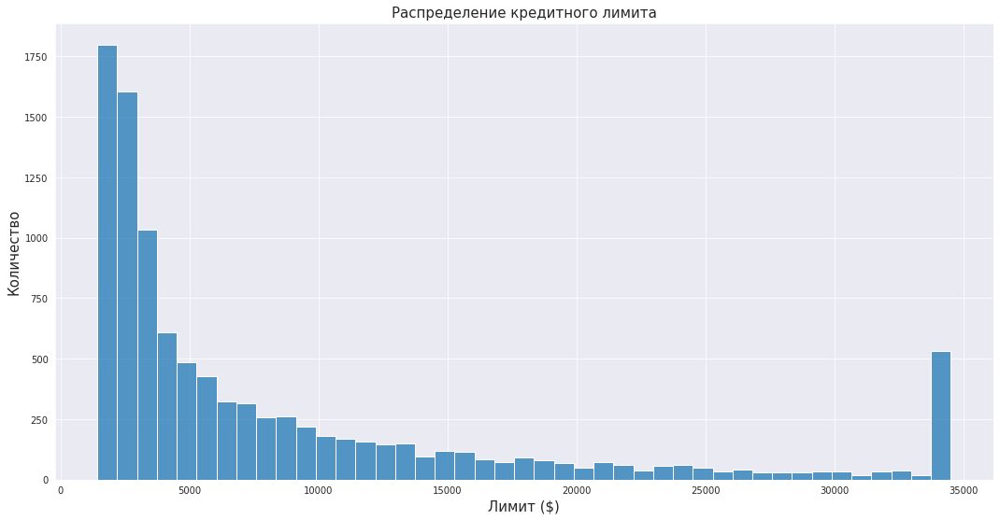

In [168]:
sns.histplot(data=df,x='Credit_Limit')
plt.title('Распределение кредитного лимита', fontsize=15)
plt.ylabel('Количество', fontsize=15)
plt.xlabel('Лимит ($)', fontsize=15)

Text(0.5, 0, 'Общая сумма транзакций ($)')

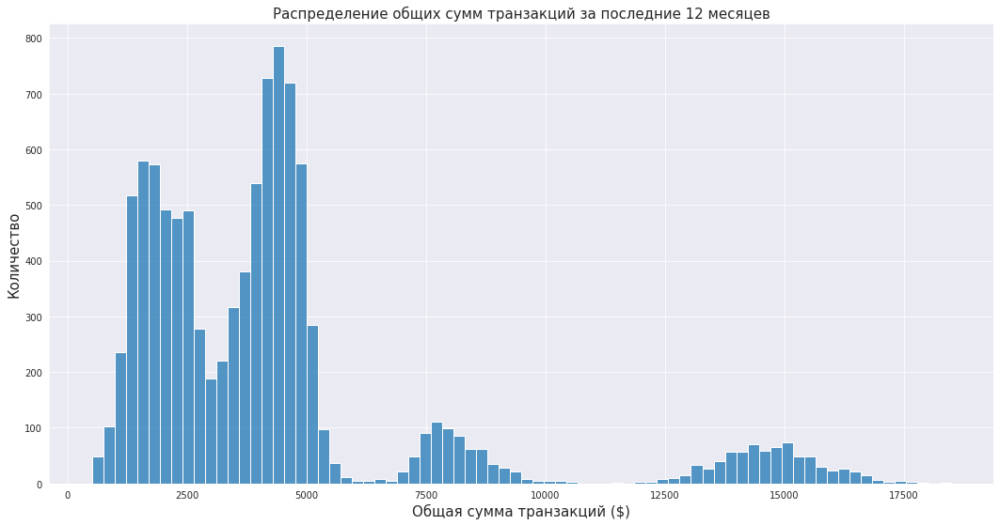

In [169]:
sns.histplot(data=df,x='Total_Trans_Amt')
plt.title('Распределение общих сумм транзакций за последние 12 месяцев', fontsize=15)
plt.ylabel('Количество', fontsize=15)
plt.xlabel('Общая сумма транзакций ($)', fontsize=15)

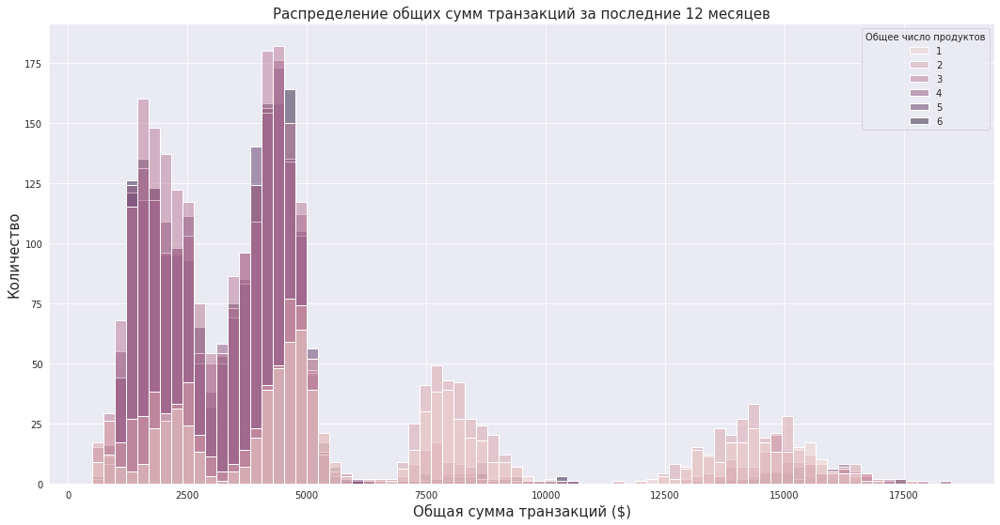

In [170]:
a = sns.histplot(data=df,x='Total_Trans_Amt', hue='Total_Relationship_Count')
plt.title('Распределение общих сумм транзакций за последние 12 месяцев', fontsize=15)
plt.ylabel('Количество', fontsize=15)
plt.xlabel('Общая сумма транзакций ($)', fontsize=15)
leg = a.axes.get_legend()
new_title = 'Общее число продуктов'
leg.set_title(new_title)
plt.show()

In [171]:
configure_plotly_browser_state()
ex.pie(df,names='Attrition_Flag',title='Соотношение ушедших и оставшихся клиентов',hole=0.33)

Text(0.5, 1.0, 'Отток клиентов')

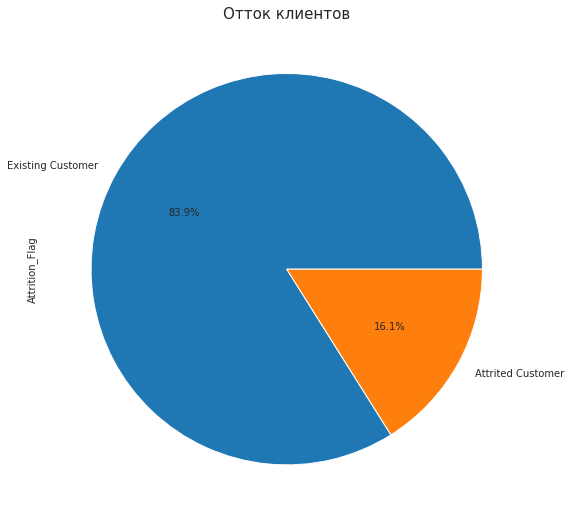

In [172]:
g = df.Attrition_Flag.value_counts().plot.pie(autopct='%1.1f%%',)
plt.title('Отток клиентов', fontsize=15)




# Предварительная обработка данных


## One-hot-encoding

In [173]:
df.Attrition_Flag = df.Attrition_Flag.replace({'Attrited Customer':1,'Existing Customer':0})
df.Gender = df.Gender.replace({'F':1,'M':0})
df = pd.concat([df,pd.get_dummies(df['Education_Level']).drop(columns=['Unknown'])],axis=1)
df = pd.concat([df,pd.get_dummies(df['Income_Category']).drop(columns=['Unknown'])],axis=1)
df = pd.concat([df,pd.get_dummies(df['Marital_Status']).drop(columns=['Unknown'])],axis=1)
df = pd.concat([df,pd.get_dummies(df['Card_Category']).drop(columns=['Platinum'])],axis=1)
df.drop(columns = ['Education_Level','Income_Category','Marital_Status','Card_Category','CLIENTNUM'],inplace=True)

Text(0.5, 1.0, 'Матрица корреляций Пирсона')

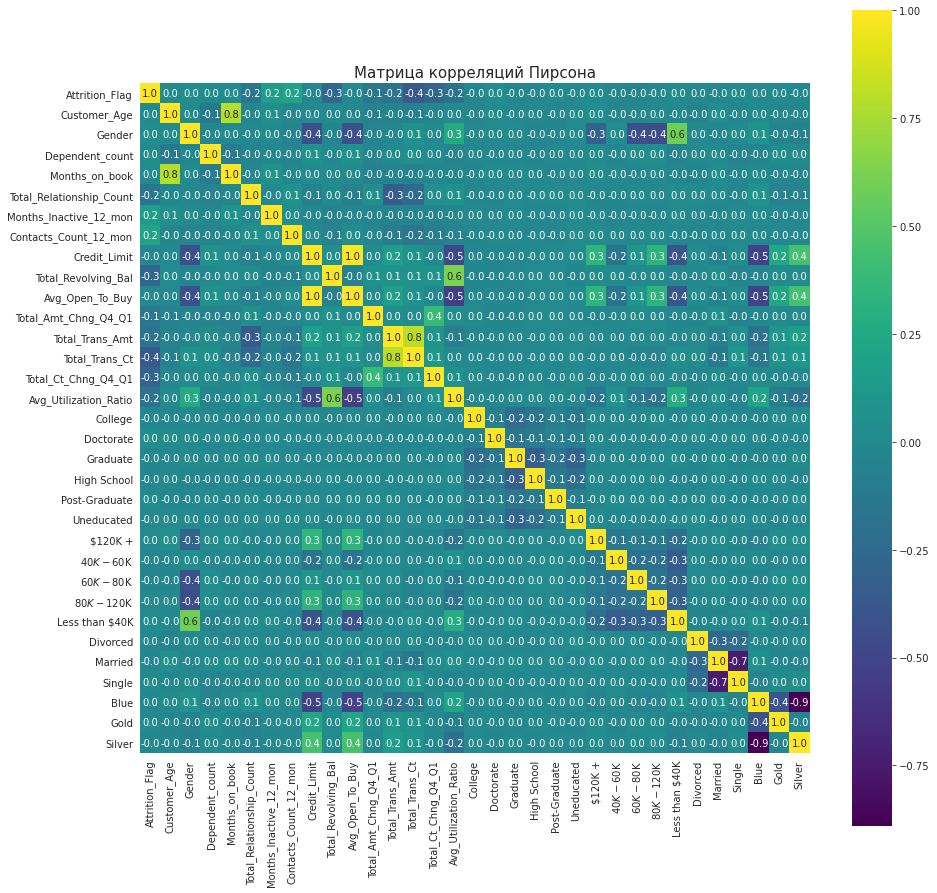

In [174]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr('pearson'), annot=True, square=True,fmt='.1f', cmap='viridis')
plt.title('Матрица корреляций Пирсона', fontsize=15)

Text(0.5, 1.0, 'Матрица корреляций Спирмана')

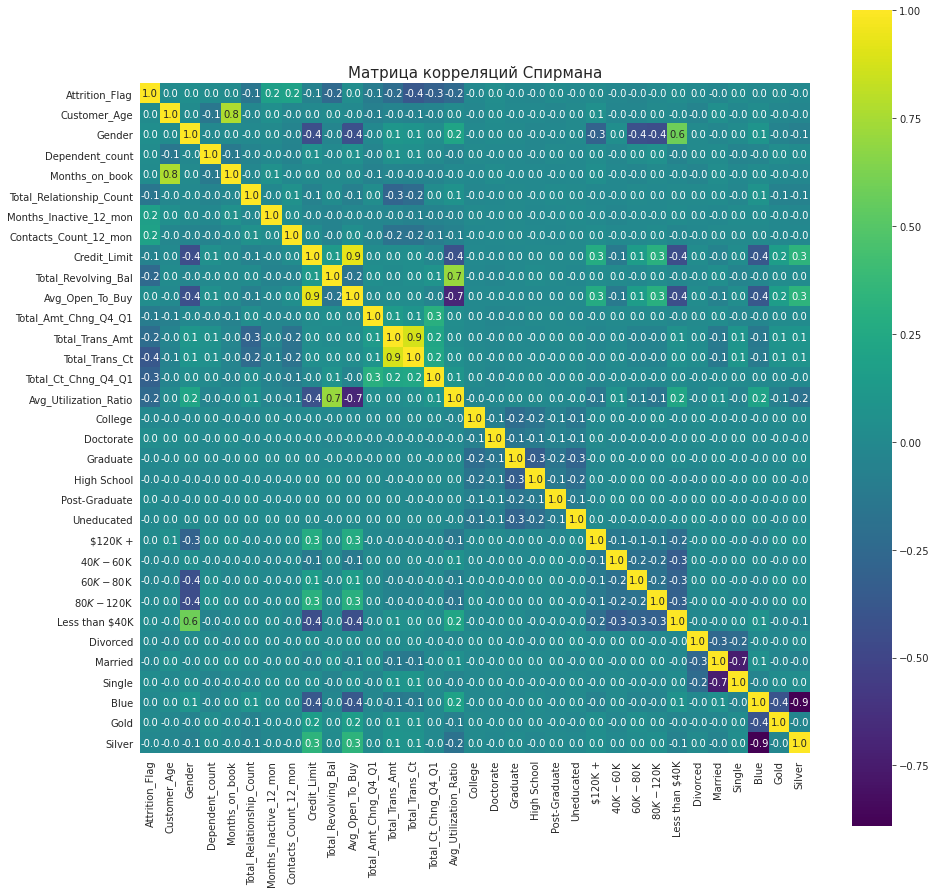

In [175]:
plt.figure(figsize=(15,15))
sns.heatmap(df.corr('spearman'), annot=True, square=True,fmt='.1f', cmap='viridis')
plt.title('Матрица корреляций Спирмана', fontsize=15)

## Апсэмплирование с помощью SMOTE


In [176]:
oversample = SMOTE()
X, y = oversample.fit_resample(df[df.columns[1:]], df[df.columns[0]])
upsampled_df = pd.DataFrame(X).rename(index=str)
upsampled_df = upsampled_df.set_axis(np.array(df.columns)[1:], axis=1)
upsampled_df = upsampled_df.assign(Churn = y)
upsampled_df

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.



,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,College,Doctorate,Graduate,High School,Post-Graduate,Uneducated,$120K +,$40K - $60K,$60K - $80K,$80K - $120K,Less than $40K,Divorced,Married,Single,Blue,Gold,Silver,Churn
0,45.000000,0.0,3.000000,39.000000,5.000000,1.000000,3.000000,12691.000000,777.000000,11914.000000,1.335000,1144.000000,42.000000,1.625000,0.061000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,1.000000,0.000000,1.0,0.0,0.0,0
1,49.000000,1.0,5.000000,44.000000,6.000000,1.000000,2.000000,8256.000000,864.000000,7392.000000,1.541000,1291.000000,33.000000,3.714000,0.105000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.000000,1.000000,1.0,0.0,0.0,0
2,51.000000,0.0,3.000000,36.000000,4.000000,1.000000,0.000000,3418.000000,0.000000,3418.000000,2.594000,1887.000000,20.000000,2.333000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0,1.000000,0.000000,1.0,0.0,0.0,0
3,40.000000,1.0,4.000000,34.000000,3.000000,4.000000,1.000000,3313.000000,2517.000000,796.000000,1.405000,1171.000000,20.000000,2.333000,0.760000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.0,0.000000,0.000000,1.0,0.0,0.0,0
4,40.000000,0.0,3.000000,21.000000,5.000000,1.000000,0.000000,4716.000000,0.000000,4716.000000,2.175000,816.000000,28.000000,2.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,1.000000,0.000000,1.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16995,39.837625,0.0,3.512875,31.811875,1.162375,2.837625,5.512875,23621.670431,0.000000,23621.670431,0.855400,8053.126045,62.110876,0.859574,0.000000,0.000000,0.000000,0.162375,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0,1.000000,0.000000,1.0,0.0,0.0,1
16996,52.548304,0.0,3.568538,42.692125,2.712359,3.000000,3.000000,2322.453879,1896.345964,426.107915,0.897831,773.665146,15.719103,0.373348,0.816371,0.000000,0.000000,0.000000,0.856179,0.000000,0.143821,0.000000,0.000000,0.856179,0.000000,0.143821,0.0,1.000000,0.000000,1.0,0.0,0.0,1
16997,48.000000,0.0,4.000000,36.684000,3.661714,3.338286,3.669143,24790.521728,0.000000,24790.521728,0.674434,1901.697701,34.308572,0.474895,0.000000,0.330857,0.000000,0.000000,0.669143,0.000000,0.000000,0.669143,0.000000,0.000000,0.330857,0.000000,0.0,0.330857,0.669143,1.0,0.0,0.0,1
16998,46.684086,0.0,4.894695,36.420824,2.052652,2.000000,2.000000,9399.996058,0.000000,9399.996058,0.593740,2183.159928,40.526129,0.850100,0.000000,0.000000,0.052652,0.000000,0.947348,0.000000,0.000000,0.052652,0.000000,0.000000,0.947348,0.000000,0.0,0.947348,0.052652,1.0,0.0,0.0,1


In [177]:
ohe_data =upsampled_df[upsampled_df.columns[15:-1]].copy(deep=True)
upsampled_df = upsampled_df.drop(columns=upsampled_df.columns[15:-1])

In [178]:
upsampled_df

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Churn
0,45.000000,0.0,3.000000,39.000000,5.000000,1.000000,3.000000,12691.000000,777.000000,11914.000000,1.335000,1144.000000,42.000000,1.625000,0.061000,0
1,49.000000,1.0,5.000000,44.000000,6.000000,1.000000,2.000000,8256.000000,864.000000,7392.000000,1.541000,1291.000000,33.000000,3.714000,0.105000,0
2,51.000000,0.0,3.000000,36.000000,4.000000,1.000000,0.000000,3418.000000,0.000000,3418.000000,2.594000,1887.000000,20.000000,2.333000,0.000000,0
3,40.000000,1.0,4.000000,34.000000,3.000000,4.000000,1.000000,3313.000000,2517.000000,796.000000,1.405000,1171.000000,20.000000,2.333000,0.760000,0
4,40.000000,0.0,3.000000,21.000000,5.000000,1.000000,0.000000,4716.000000,0.000000,4716.000000,2.175000,816.000000,28.000000,2.500000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16995,39.837625,0.0,3.512875,31.811875,1.162375,2.837625,5.512875,23621.670431,0.000000,23621.670431,0.855400,8053.126045,62.110876,0.859574,0.000000,1
16996,52.548304,0.0,3.568538,42.692125,2.712359,3.000000,3.000000,2322.453879,1896.345964,426.107915,0.897831,773.665146,15.719103,0.373348,0.816371,1
16997,48.000000,0.0,4.000000,36.684000,3.661714,3.338286,3.669143,24790.521728,0.000000,24790.521728,0.674434,1901.697701,34.308572,0.474895,0.000000,1
16998,46.684086,0.0,4.894695,36.420824,2.052652,2.000000,2.000000,9399.996058,0.000000,9399.996058,0.593740,2183.159928,40.526129,0.850100,0.000000,1


Text(0.5, 1.0, 'Матрица корреляций Пирсона')

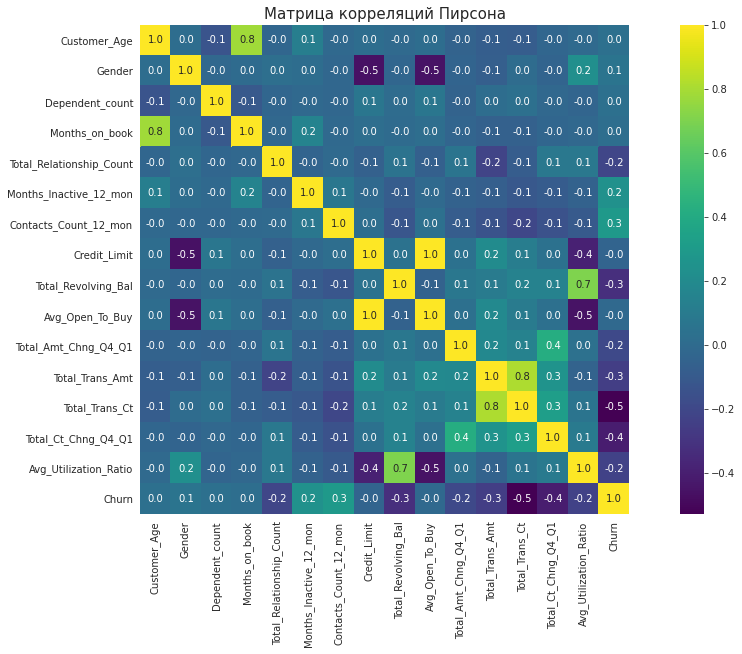

In [179]:
sns.heatmap(upsampled_df.corr('pearson'), annot=True, square=True,fmt='.1f', cmap='viridis')
plt.title('Матрица корреляций Пирсона', fontsize=15)

Text(0.5, 1.0, 'Матрица корреляций Спирмана')

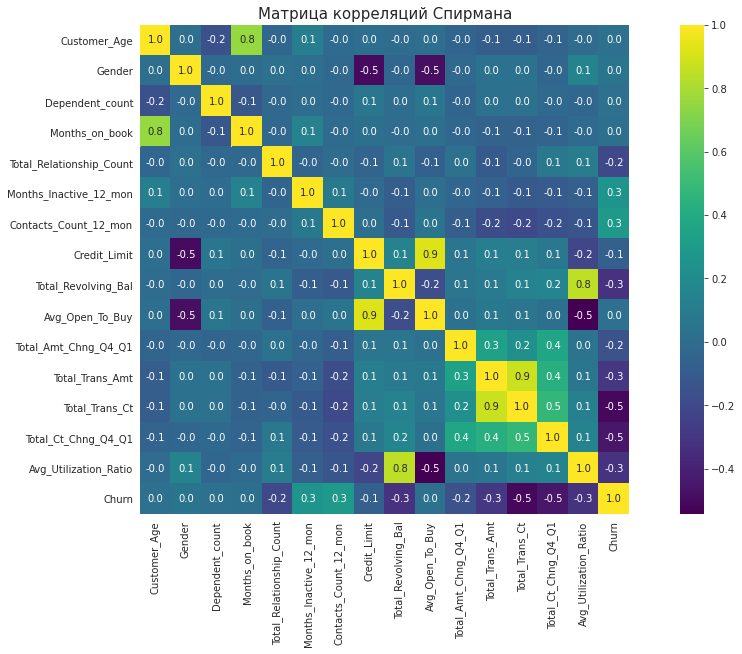

In [180]:
sns.heatmap(upsampled_df.corr('spearman'), annot=True, square=True,fmt='.1f', cmap='viridis')
plt.title('Матрица корреляций Спирмана', fontsize=15)

## PCA для категориальных признаков


In [181]:
N_COMPONENTS = 4

pca_model = PCA(n_components = N_COMPONENTS )
pc_matrix = pca_model.fit_transform(ohe_data)

In [182]:
exp_vr = pca_model.explained_variance_ratio_
total_var = exp_vr.sum() * 100
cumsum_exp_vr = np.cumsum(exp_vr)

trace1 = {
    "name": "индивидуальные объяснённые дисперсии", 
    "type": "bar", 
    'y':exp_vr}
trace2 = {
    "name": "кумулятивная объяснённая дисперсия", 
    "type": "scatter", 
     'y':cumsum_exp_vr}
data = [trace1, trace2]
layout = {
    "xaxis": {"title": "Главные компоненты"}, 
    "yaxis": {"title": "Объяснённая дисперсия"},
  }

configure_plotly_browser_state()
fig = go.Figure(data=data, layout=layout)
fig.update_layout(title='Объяснённая дисперсия {} компонент'.format(N_COMPONENTS))
fig.show()

In [183]:
pca_s = pd.DataFrame(pc_matrix,columns=['PC{}'.format(i) for i in range(0,N_COMPONENTS)])
pca_s

,PC0,PC1,PC2,PC3
0,-0.698707,-0.478433,-0.499027,-0.659323
1,0.758967,0.819788,0.567316,-0.134459
2,-0.714561,-0.245711,0.797785,0.014412
3,0.062038,0.536476,-0.724040,-0.607625
4,-0.671695,-0.422731,-0.254413,0.689396
...,...,...,...,...
16995,-0.705601,-0.411519,0.089309,0.183080
16996,-0.688145,-0.319198,-0.497467,-0.458459
16997,0.251218,-0.449921,-0.381352,-0.300345
16998,-0.638439,-0.533081,-0.461233,-0.458339


In [184]:
upsampled_pcs_df = pd.concat([upsampled_df.reset_index(drop=True), pca_s.reset_index(drop=True)], axis=1)  

In [185]:
upsampled_pcs_df

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Churn,PC0,PC1,PC2,PC3
0,45.000000,0.0,3.000000,39.000000,5.000000,1.000000,3.000000,12691.000000,777.000000,11914.000000,1.335000,1144.000000,42.000000,1.625000,0.061000,0,-0.698707,-0.478433,-0.499027,-0.659323
1,49.000000,1.0,5.000000,44.000000,6.000000,1.000000,2.000000,8256.000000,864.000000,7392.000000,1.541000,1291.000000,33.000000,3.714000,0.105000,0,0.758967,0.819788,0.567316,-0.134459
2,51.000000,0.0,3.000000,36.000000,4.000000,1.000000,0.000000,3418.000000,0.000000,3418.000000,2.594000,1887.000000,20.000000,2.333000,0.000000,0,-0.714561,-0.245711,0.797785,0.014412
3,40.000000,1.0,4.000000,34.000000,3.000000,4.000000,1.000000,3313.000000,2517.000000,796.000000,1.405000,1171.000000,20.000000,2.333000,0.760000,0,0.062038,0.536476,-0.724040,-0.607625
4,40.000000,0.0,3.000000,21.000000,5.000000,1.000000,0.000000,4716.000000,0.000000,4716.000000,2.175000,816.000000,28.000000,2.500000,0.000000,0,-0.671695,-0.422731,-0.254413,0.689396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16995,39.837625,0.0,3.512875,31.811875,1.162375,2.837625,5.512875,23621.670431,0.000000,23621.670431,0.855400,8053.126045,62.110876,0.859574,0.000000,1,-0.705601,-0.411519,0.089309,0.183080
16996,52.548304,0.0,3.568538,42.692125,2.712359,3.000000,3.000000,2322.453879,1896.345964,426.107915,0.897831,773.665146,15.719103,0.373348,0.816371,1,-0.688145,-0.319198,-0.497467,-0.458459
16997,48.000000,0.0,4.000000,36.684000,3.661714,3.338286,3.669143,24790.521728,0.000000,24790.521728,0.674434,1901.697701,34.308572,0.474895,0.000000,1,0.251218,-0.449921,-0.381352,-0.300345
16998,46.684086,0.0,4.894695,36.420824,2.052652,2.000000,2.000000,9399.996058,0.000000,9399.996058,0.593740,2183.159928,40.526129,0.850100,0.000000,1,-0.638439,-0.533081,-0.461233,-0.458339


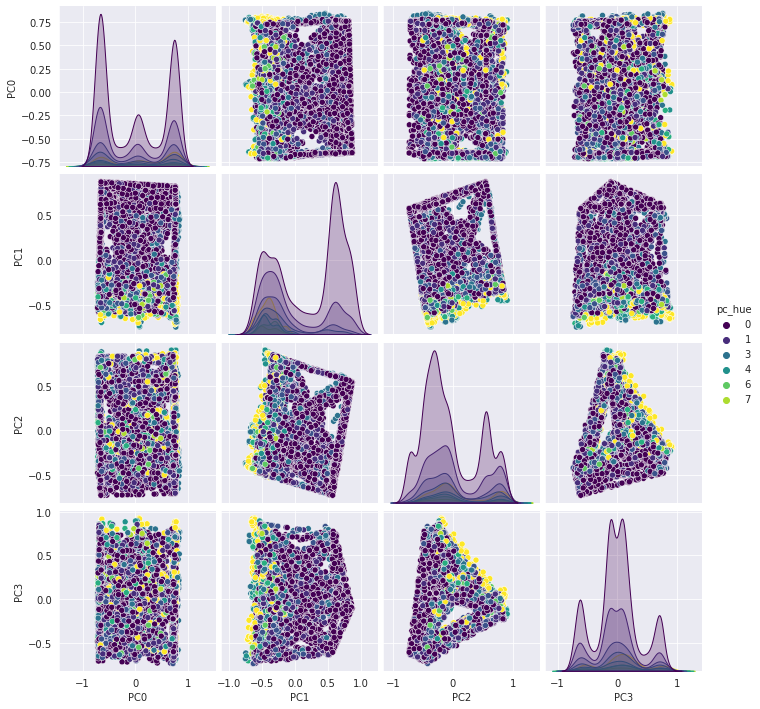

In [188]:
upsampled_pcs_df['pc_hue'] = upsampled_pcs_df.Credit_Limit.apply(lambda x: (x // 4000)).astype('int64')
sns.pairplot(data=upsampled_pcs_df, hue='pc_hue', vars=['PC0', 'PC1', 'PC2', 'PC3'],palette='viridis')

Text(0.5, 1.0, 'Матрица корреляций Пирсона')

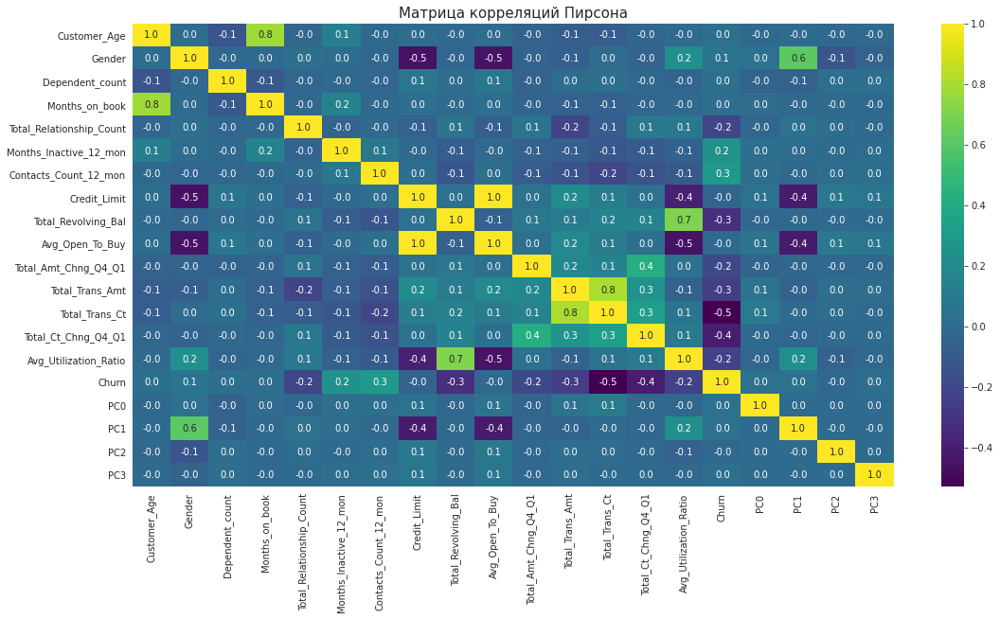

In [189]:
upsampled_pcs_df = upsampled_pcs_df.drop('pc_hue', axis=1)
sns.heatmap(upsampled_pcs_df.corr('pearson'), annot=True, square=False,fmt='.1f', cmap='viridis')
plt.title('Матрица корреляций Пирсона', fontsize=15)

Text(0.5, 1.0, 'Матрица корреляций Пирсона')

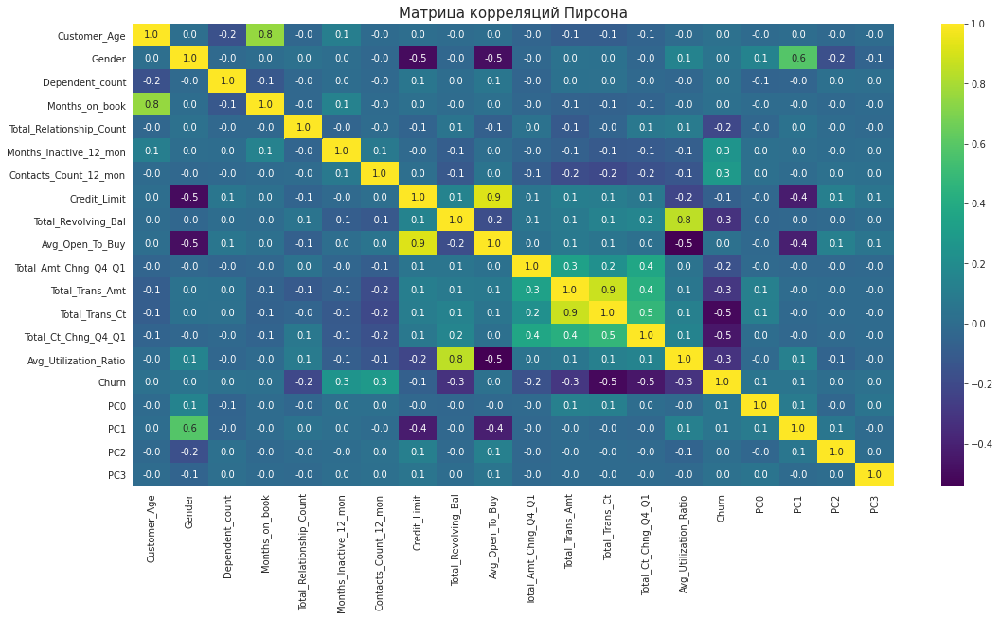

In [190]:
sns.heatmap(upsampled_pcs_df.corr('spearman'), annot=True, square=False,fmt='.1f', cmap='viridis')
plt.title('Матрица корреляций Пирсона', fontsize=15)

# Выбор признаков и обучение моделей


In [191]:
X_features = ['Total_Trans_Ct','Total_Ct_Chng_Q4_Q1','Total_Relationship_Count','PC0','PC1','PC2','PC3']

X = upsampled_pcs_df[X_features]
y = upsampled_pcs_df['Churn']

In [192]:
train_x,test_x,train_y,test_y = train_test_split(X,y,random_state=42)

In [193]:
test_y.shape

(4250,)

## Кросс-валидация

In [194]:
rf_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",RandomForestClassifier(random_state=42)) ])
svm_pipe = Pipeline(steps =[ ('scale',StandardScaler()), ("RF",SVC(random_state=42,kernel='rbf')) ])

f1_cross_val_scores = cross_val_score(rf_pipe,train_x,train_y,cv=5,scoring='f1')
svm_f1_cross_val_scores=cross_val_score(svm_pipe,train_x,train_y,cv=5,scoring='f1')

In [195]:
configure_plotly_browser_state()
fig = make_subplots(rows=2, cols=1,shared_xaxes=True,subplot_titles=('Оценка метода случайного леса',
                                                                    'Оценка метода опорных векторов'))

fig.add_trace(
    go.Scatter(x=list(range(0,len(f1_cross_val_scores))),y=f1_cross_val_scores,name='Случайный лес'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=list(range(0,len(svm_f1_cross_val_scores))),y=svm_f1_cross_val_scores,name='SVM'),
    row=2, col=1
)

fig.update_layout(height=700, width=900, title_text="Перекрёстный контроль, разбиение на 5 частей")
fig.update_yaxes(title_text="F1 оценка")
fig.update_xaxes(title_text="Части")

fig.show()

## Обучение моделей и прогнозирование

In [196]:
rf_pipe.fit(train_x,train_y)
rf_prediction = rf_pipe.predict(test_x)

svm_pipe.fit(train_x,train_y)
svm_prediction = svm_pipe.predict(test_x)

In [197]:
configure_plotly_browser_state()
fig = go.Figure(data=[go.Table(header=dict(values=['<b>Модель<b>', '<b>F1-оценка на тестовой выборке<b>'],
                                           line_color='darkslategray',
    fill_color='whitesmoke',
    align=['center','center'],
    font=dict(color='black', size=18),
    height=40),
                               
                 cells=dict(values=[['<b>Случайный лес<b>', '<b>SVM<b>'], [np.round(f1(rf_prediction,test_y),2),
                                                                          np.round(f1(svm_prediction,test_y),2)]]))
                     ])

fig.update_layout(title='Оценка моделей на тестовой выборке')
fig.show()

<Figure size 720x720 with 0 Axes>

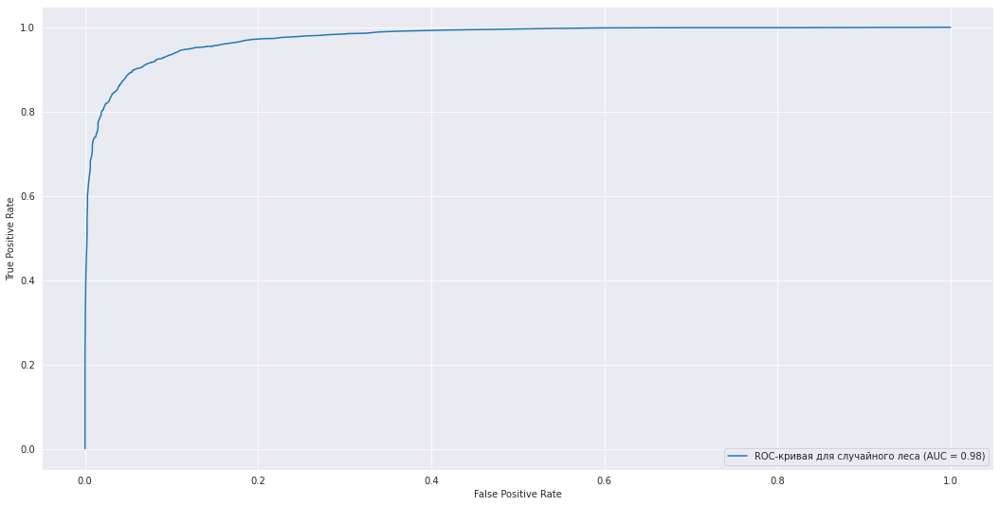

In [198]:
plt.figure(figsize=(10,10))
plot_roc_curve(rf_pipe, test_x, test_y, name='ROC-кривая для случайного леса')

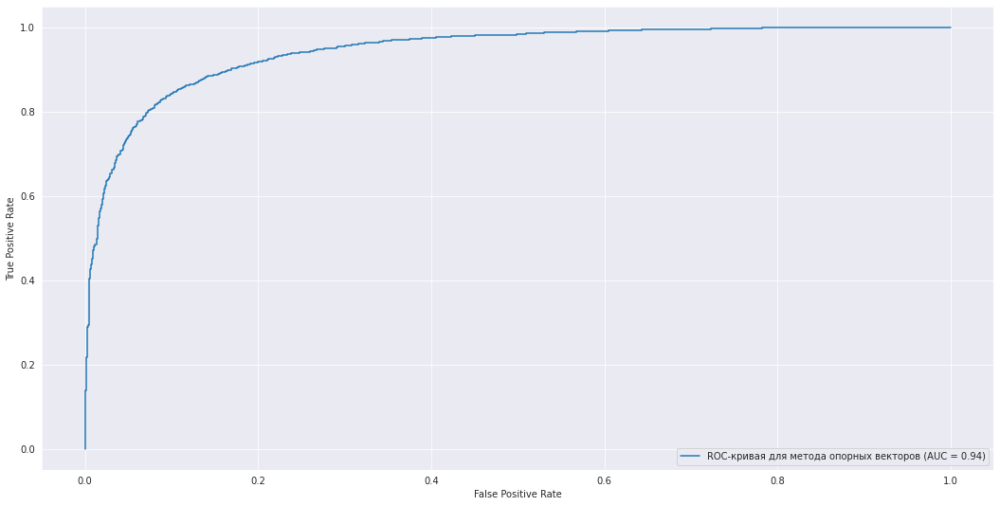

In [199]:
plot_roc_curve(svm_pipe, test_x, test_y, name='ROC-кривая для метода опорных векторов')

## Прогнозирование на оригинальном наборе данных

In [200]:
ohe_data =df[df.columns[16:]].copy()
pc_matrix = pca_model.fit_transform(ohe_data)
original_pcs_df = pd.concat([df,pd.DataFrame(pc_matrix,columns=['PC{}'.format(i) for i in range(0,N_COMPONENTS)])],axis=1)

original_data_prediction_RF = rf_pipe.predict(original_pcs_df[X_features])
original_data_prediction_SVM = svm_pipe.predict(original_pcs_df[X_features])

In [201]:
configure_plotly_browser_state()
fig = go.Figure(data=[go.Table(header=dict(values=['<b>Model<b>', '<b>F1-оценка на оригинальных данных<b>'],
                                           line_color='darkslategray',
    fill_color='whitesmoke',
    align=['center','center'],
    font=dict(color='black', size=18),
    height=40),
                               
                 cells=dict(values=[['<b>Случайный лес<b>', '<b>SVM<b>'], [np.round(f1(original_data_prediction_RF,original_pcs_df['Attrition_Flag']),2), 
                                                                          np.round(f1(original_data_prediction_SVM,original_pcs_df['Attrition_Flag']),2)]]))
                     ])

fig.update_layout(title='Оценка моделей на оригинальных данных')
fig.show()

# Результаты

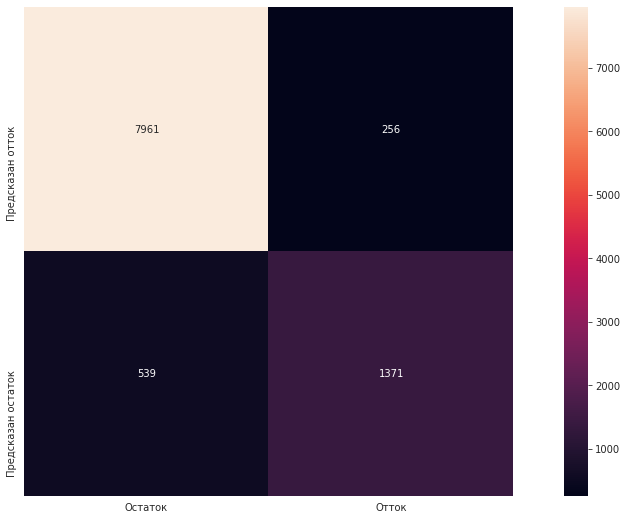

In [202]:
sns.heatmap(data=res, annot=True, fmt='.0f', xticklabels=['Остаток', 'Отток'], yticklabels=['Предсказан отток','Предсказан остаток'], square=True)

<Figure size 720x720 with 0 Axes>

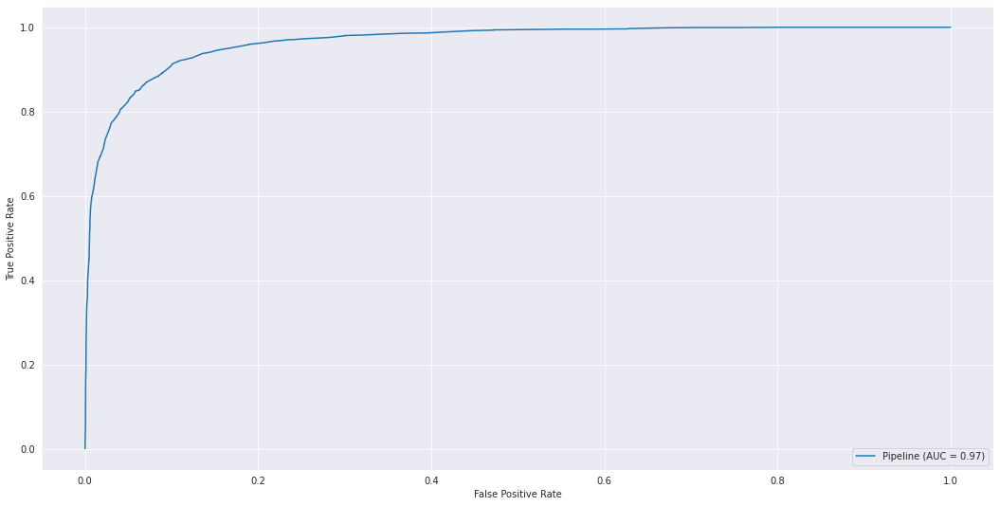

In [203]:
plt.figure(figsize=(10,10))
plot_roc_curve(rf_pipe,original_pcs_df[X_features],original_pcs_df['Attrition_Flag'])